# Predicting Rice Crop Yeild In Vietnam
#### Authors: Divyadarshan Punjabi, Reza Mursalin, Nirvaan Rohira, and Advitya Hajela

# Outline

- [Introduction and Current Literature](#section1)
- [Setting up the import statements and the themes](#section2)
- [Loading the Datasets](#section3)
- [Lets visualize the data coming from the satellites for a sample location](#section4.1)
- [Feature Engineering](#section4)
    - [From Landsat](#section7.1)
    - [From Sentinel 1](#section7.2)
    - [From Sentinel 2](#section7.3)
- [Now let's start building the model](#section8)
    - [Feature Extraction](#section9)
    - [ML Regression Models](#section10)
    - [Bagging](#section11)
- [Bottlenecks and Methods of Improvements](#section12)
- [Impacts of Our Project](#section13)
- [References](#section14)

## Introduction and Current Literature <a id="section1"></a>

In 2020, between "720 to 811 million people worldwide were suffering from hunger." Unfortunately, even more people (about 2.4 Billion people) are moderately to severely food insecure [(UN SDG Indicators)](#sdgindicators). Due to this our group decided to address this by adhereing to the UN Sustainable Development Goals, especially Goal 2: Zero Hunger. We do so by aiming to create a regression model for farmers to predict crop yield using just satellite data and some ground-truth data. Vietnam is a low-income country with limited resources and a major exporter of rice. Hence, we choose to predict rice crop yield in Vietnam. 

Currently, the highest accuracy achieved in predicting any crop yield, after decades of research, is 0.86 [(Seungtaek Jeong et al. (2021))](#Seungtaek2021).

## Setting up the import statements and the themes <a id="section2"></a>

In [1]:
pip install xgboost catboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import ipyleaflet
import matplotlib.pyplot as plt
from IPython.display import Image
import seaborn as sns

# Data Science
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from scipy.interpolate import interp1d
from datetime import datetime, timedelta

# Machine Learning
import graphviz
import xgboost as xgb
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.model_selection import learning_curve
from sklearn.feature_selection import RFECV

# Planetary Computer Tools
import pystac
import pystac_client
import odc
from pystac_client import Client
from pystac.extensions.eo import EOExtension as eo
from odc.stac import stac_load
import planetary_computer as pc

# Import common GIS tools
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import rasterio.features
import rioxarray as rio
import xrspatial.multispectral as ms
from contextlib import redirect_stdout
import os
import sys

# Pass your API key here
pc.settings.set_subscription_key('71113eb526914deba51505c8b5463b88')

## Loading the Dataset <a id="section3"></a>

In [3]:
locations = pd.read_csv("Crop_Yield_Data.csv") # Ground Truth Data
weather_data = pd.read_csv('Chau Phu, Vietnam 2021-10-01 to 2022-09-01.csv')
weather_data1 = pd.read_csv('Chau Thanh, Vietnam 2021-10-01 to 2022-09-01.csv')
weather_data2 = pd.read_csv('Thoai Son 2021-10-01 to 2022-09-01.csv')

In [4]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336 entries, 0 to 335
Data columns (total 33 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              336 non-null    object 
 1   datetime          336 non-null    object 
 2   tempmax           336 non-null    float64
 3   tempmin           336 non-null    float64
 4   temp              336 non-null    float64
 5   feelslikemax      336 non-null    float64
 6   feelslikemin      336 non-null    float64
 7   feelslike         336 non-null    float64
 8   dew               336 non-null    float64
 9   humidity          336 non-null    float64
 10  precip            336 non-null    float64
 11  precipprob        336 non-null    int64  
 12  precipcover       336 non-null    float64
 13  preciptype        274 non-null    object 
 14  snow              235 non-null    float64
 15  snowdepth         235 non-null    float64
 16  windgust          238 non-null    float64
 1

## Lets visualize the data coming from the satellites for a sample location <a id="section4.1"></a>

Rice crop phenology examines growth stages and timings in rice plants. Phenology curves track development parameters like leaf area index, biomass, and vegetation indices. These curves aid in monitoring crops, predicting yields, and planning agricultural practices in Vietnam. By combining weather data with phenology curves, we can use growth stages as predictors in a data-driven ML model.

First, we define our area of interest using the centroid's latitude and longitude coordinates. We then establish the size of the surrounding bounding box (in degrees) and set a time window for a typical rice growing season.

Bounding boxes are rectangular regions outlining areas of interest in remote sensing imagery, represented by (xmin, ymin, xmax, ymax) coordinates. Landsat's 30-meter and Sentinel-1's 10-meter resolutions balance data volume, swath widths, revisit times, and applications like land coverage and agriculture.

We maintained a bounding box factor of 0.10 degrees for Landsat and 0.0004 for Sentinel 1 & 2. Increasing the factor led to excessive memory consumption and significantly longer processing times, while a smaller factor failed to provide adequate information for the machine learning models.

In [5]:
# Sample Rice Crop Field in An Giang, Vietnam
lat_long = (10.4391, 105.3338) # Lat-Lon centroid location
box_size_deg1 = 0.10 # Surrounding box in degrees

# Calculate the Lat-Lon bounding box region
min_lon = lat_long[1]-box_size_deg1/2
min_lat = lat_long[0]-box_size_deg1/2
max_lon = lat_long[1]+box_size_deg1/2
max_lat = lat_long[0]+box_size_deg1/2
bounds = (min_lon, min_lat, max_lon, max_lat)

# Define the time window
time_window="2021-12-01/2022-04-30"

# Define the pixel resolution for the final product
# Define the scale according to our selected crs, so we will use degrees
resolution1 = 30  # meters per pixel 
scale1 = resolution1 / 111320.0 # degrees per pixel for CRS:4326 

### For Landsat

Using the `pystac_client` we can search the Planetary Computer's STAC catalog for items matching our query parameters. 
The result is the number of scenes matching our search criteria that touch our area of interest. 
Some of these may be partial scenes and may contain clouds. 

In [6]:
stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
search = stac.search(
    collections=["landsat-c2-l2"], 
    bbox=bounds, 
    datetime=time_window,
    query={"platform": {"in": ["landsat-8", "landsat-9"]},},
)
items = list(search.get_all_items())
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 31


In [7]:
xx = stac_load(
    items,
    bands=["red", "green", "blue", "nir08", "qa_pixel"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=scale1, # Degrees
    chunks={"x": 2048, "y": 2048},
    patch_url=pc.sign,
    bbox=bounds
)

# Apply scaling and offsets for Landsat Collection-2 (reference below) to the spectral bands ONLY
# https://planetarycomputer.microsoft.com/dataset/landsat-c2-l2
xx['red'] = (xx['red']*0.0000275)-0.2
xx['green'] = (xx['green']*0.0000275)-0.2
xx['blue'] = (xx['blue']*0.0000275)-0.2
xx['nir08'] = (xx['nir08']*0.0000275)-0.2

# View the dimensions of our XARRAY and the variables
display(xx)

<xarray.Dataset>
Dimensions:      (latitude: 372, longitude: 372, time: 31)
Coordinates:
  * latitude     (latitude) float64 10.49 10.49 10.49 ... 10.39 10.39 10.39
  * longitude    (longitude) float64 105.3 105.3 105.3 ... 105.4 105.4 105.4
    spatial_ref  int32 4326
  * time         (time) datetime64[ns] 2021-12-01T03:20:47.203656 ... 2022-04...
Data variables:
    red          (time, latitude, longitude) float64 dask.array<chunksize=(1, 372, 372), meta=np.ndarray>
    green        (time, latitude, longitude) float64 dask.array<chunksize=(1, 372, 372), meta=np.ndarray>
    blue         (time, latitude, longitude) float64 dask.array<chunksize=(1, 372, 372), meta=np.ndarray>
    nir08        (time, latitude, longitude) float64 dask.array<chunksize=(1, 372, 372), meta=np.ndarray>
    qa_pixel     (time, latitude, longitude) uint16 dask.array<chunksize=(1, 372, 372), meta=np.ndarray>

#### View RGB (real color) images from the time series

Data is available for Landsat-8 from April 2013 onwards and for Landsat-9 from February 2022 onwards. Typically, our region is viewed every 8 days, with additional scenes due to overlaps. Over a 5-month example, 31 time slices touch our region, but only 7 are very clear, with several others being partially cloudy.

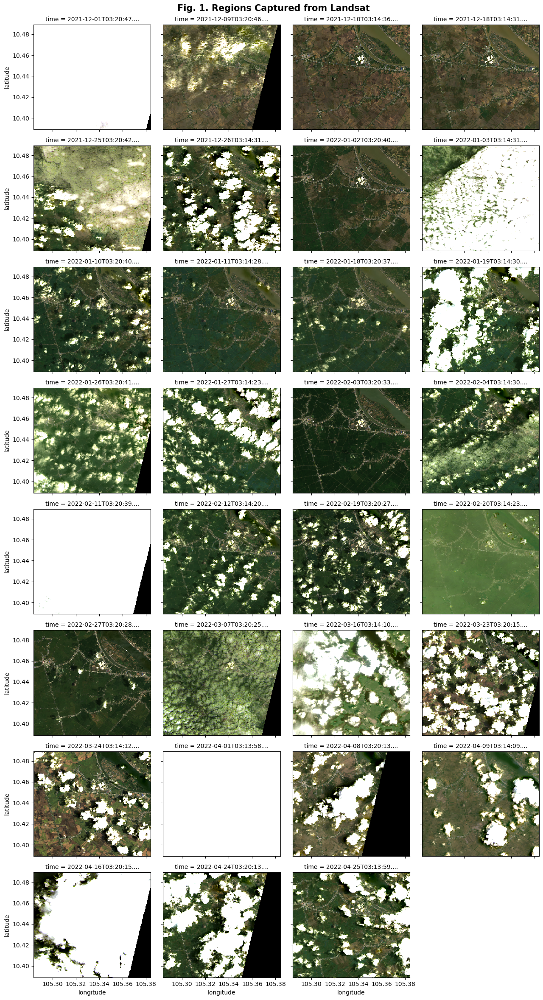

In [8]:
plot_xx = xx[["red","green","blue"]].to_array()
plot = plot_xx.plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=0.3)
plot.fig.suptitle("Fig. 1. Regions Captured from Landsat", fontsize=15, fontweight='bold')
plot.fig.subplots_adjust(top=0.96)
plt.show()

In [9]:
# Select a time slice to view a simple RGB image and the cloud mask
# See the XARRAY dimensions above for the number of time slices (starts at 0)

# Slice #6 - Mostly Clear
# Slice #24 - Scattered Clouds
# Slice #7 - Very Cloudy

time_slice = 24

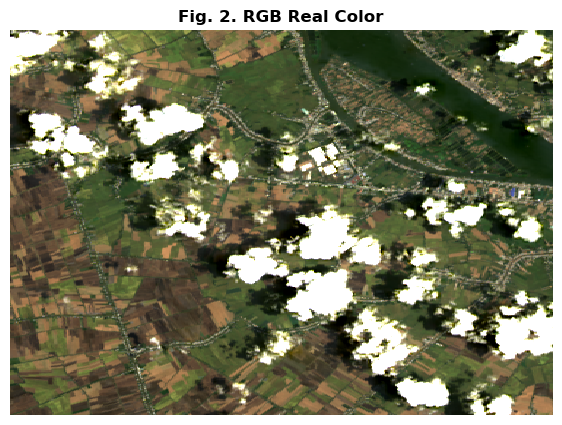

In [10]:
# Plot and RGB Real Color Image for a single date
fig, ax = plt.subplots(figsize=(7, 5))
xx.isel(time=time_slice)[["red", "green", "blue"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0, vmax=0.3)
ax.set_title("Fig. 2. RGB Real Color", fontweight='bold')
ax.axis('off')
plt.show()

#### Applying Cloud Filtering and Masking

Cloud masking for Landsat Collection-2 Level-2 data involves using the <b>"qa_pixel"</b> band to classify pixels as cloud, water, or cloud shadow. Creating a mask for these categories allows us to extract clear pixels for assessing vegetation state.

In [11]:
# To mask the pixels and find clouds or water, it is best to use the bit values of the 16-bit qa_pixel flag
# See the website above for a nice explanation of the process

bit_flags = {
            'fill': 1<<0,
            'dilated_cloud': 1<<1,
            'cirrus': 1<<2, 
            'cloud': 1<<3,
            'shadow': 1<<4, 
            'snow': 1<<5, 
            'clear': 1<<6,
            'water': 1<<7
}

In [12]:
# Create a function that will mask pixels with a given type

def get_mask(mask, flags_list):
    
    # Create the result mask filled with zeros and the same shape as the mask
    final_mask = np.zeros_like(mask)
    
    # Loop through the flags  
    for flag in flags_list:
        
        # get the mask for each flag
        flag_mask = np.bitwise_and(mask, bit_flags[flag])
        
        # add it to the final flag
        final_mask = final_mask | flag_mask
    
    return final_mask > 0

In [13]:
# Pick a single time slice to view a mask with clouds and water
sample_xx = xx.isel(time=time_slice)

In [14]:
# Find the pixels that are no data (fill), clouds, cloud shadows, or water
my_mask = get_mask(sample_xx['qa_pixel'],
                   ['fill', 'dilated_cloud', 'cirrus', 
                    'cloud', 'shadow', 'water'])

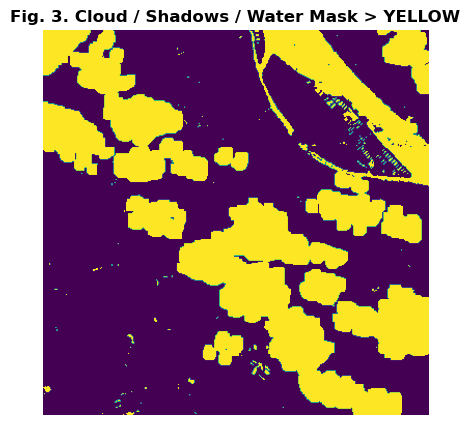

In [15]:
# Show only the mask (Yellow) with valid data in Purple
plt.figure(figsize=(7,5))
plt.imshow(my_mask)
plt.title("Fig. 3. Cloud / Shadows / Water Mask > YELLOW", fontweight='bold')
plt.axis('off')
plt.show()

In [16]:
# Create an RGB function that will display the mask over the background RGB image

def plot_masked_rgb(red, green, blue, mask, color_mask=(1, 0, 0), transparency=0.5, brightness=2):
    
    # to improve our visualization, we will increase the brightness of our values
    red = red / red.max() * brightness
    green = green / green.max() * brightness
    blue = blue / blue.max() * brightness
    
    red = np.where(mask==True, red*transparency+color_mask[0]*(1-transparency), red)
    green = np.where(mask==True, green*transparency+color_mask[1]*(1-transparency), green)
    blue = np.where(mask==True, blue*transparency+color_mask[2]*(1-transparency), blue)
    
    rgb = np.stack([red, green, blue], axis=2)
    
    return rgb

rgb = plot_masked_rgb(sample_xx['red'], sample_xx['green'], sample_xx['blue'], my_mask, color_mask=(1, 0, 1), transparency=0.2, brightness=3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


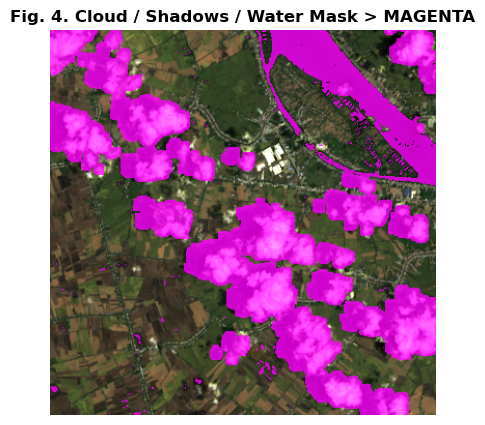

In [17]:
# This is a nice image that shows the clouds and water pixels (Purple) among clear land pixels
plt.figure(figsize=(7,5))
plt.imshow(rgb)
plt.title("Fig. 4. Cloud / Shadows / Water Mask > MAGENTA", fontweight='bold')
plt.axis('off')
plt.show()

After applying cloud masking and filtering to our region, we'll calculate the <b>Normalized Difference Vegetation Index (NDVI)</b> for both filtered and unfiltered pixels to compare accuracy. We will eventually calculate NDVI for all the locations in our dataset.

NDVI measures vegetation "greenness" with a range of 0.0 to 1.0. Low values (0.0-0.25) indicate little vegetation, middle values (0.25-0.6) represent growing crops, and high values (0.6-1.0) signify peak vegetation. The equation is: <b>NDVI = (NIR-Red) / (NIR+Red)</b>.
    
The NDVI plot shows unfiltered (BLUE) and filtered (GREEN) pixels. Gaps in filtered data signify unavailable clean pixels for NDVI calculation. Similar values suggest low cloud volume, while large differences indicate high cloud volume affecting NDVI. Filtering clouds before NDVI calculation improves phenology accuracy for agricultural plots.

In [18]:
# Calculate the mask for the entire xarray (all time slices)
full_mask = get_mask(xx['qa_pixel'], ['fill', 'dilated_cloud', 'cirrus', 'cloud', 'shadow', 'water'])

# Create a "clean" dataset with the mask applied 
cleaned_data = xx.where(~full_mask)

# Calculate the mean of the data across the sample region and then NDVI
# Perform this calculation for the unfiltered and cloud-filtered (clean) datasets
mean_unfiltered = xx.mean(dim=['longitude','latitude']).compute()
ndvi_mean = (mean_unfiltered.nir08-mean_unfiltered.red)/(mean_unfiltered.nir08+mean_unfiltered.red)
mean_clean = cleaned_data.mean(dim=['longitude','latitude']).compute()
ndvi_mean_clean = (mean_clean.nir08-mean_clean.red)/(mean_clean.nir08+mean_clean.red)

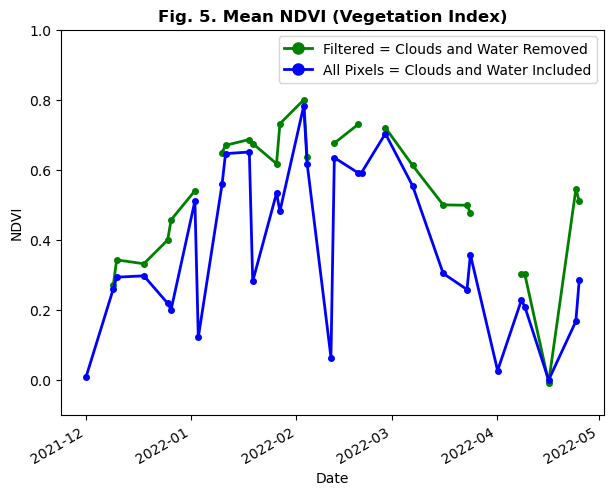

In [19]:
fig = plt.figure(figsize=(7, 5))
ndvi_mean_clean.plot(color='green',marker='o',markersize=4,linewidth=2, label="Filtered = Clouds and Water Removed")
ndvi_mean.plot(color='blue',marker='o',markersize=4,linewidth=2, label="All Pixels = Clouds and Water Included")
plt.title("Fig. 5. Mean NDVI (Vegetation Index)", fontweight='bold')
plt.xlabel("Date")
plt.ylabel("NDVI")
plt.ylim(-0.1,1.0)
plt.legend(loc="upper right", markerscale=2., scatterpoints=1, fontsize=10)
plt.show()

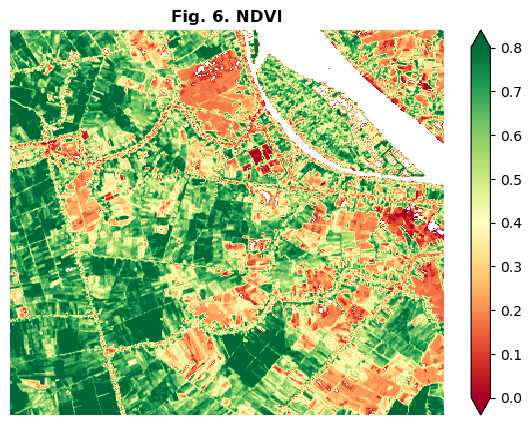

In [20]:
# Plot an NDVI image for a single date with few clouds
# We will select image (index=6) on January 2, 2022. Notice how the water is masked out.

fig = plt.figure(figsize=(7, 5))
ndvi_image = (cleaned_data.nir08-cleaned_data.red)/(cleaned_data.nir08+cleaned_data.red)
ndvi_image.isel(time=6).plot(vmin=0.0, vmax=0.8, cmap="RdYlGn")
plt.title("Fig. 6. NDVI", fontweight='bold')
plt.axis('off')
plt.show()

### For Sentinel 1

In [21]:
box_size_deg2 = 0.0004 # Surrounding box in degrees, yields approximately 5x5 pixel region
resolution2 = 10  # meters per pixel 
scale2 = resolution2 / 111320.0 # degrees per pixel for crs=4326 

catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
search = catalog.search(collections=["sentinel-1-rtc"], bbox=bounds, datetime=time_window)
items = list(search.get_all_items())
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 27


In [22]:
# Load the data using Open Data Cube
data = stac_load(items,bands=["vv", "vh"], patch_url=pc.sign, bbox=bounds, crs="EPSG:4326", resolution=scale2)

# View the details of our xarray dataset
# The X and Y dimensions tell us the pixel dimensions of our bounding box
# The "time" variable is the number of scenes that touch our region
data

<xarray.Dataset>
Dimensions:      (latitude: 1114, longitude: 1114, time: 27)
Coordinates:
  * latitude     (latitude) float64 10.49 10.49 10.49 ... 10.39 10.39 10.39
  * longitude    (longitude) float64 105.3 105.3 105.3 ... 105.4 105.4 105.4
    spatial_ref  int32 4326
  * time         (time) datetime64[ns] 2021-12-04T22:46:07.919581 ... 2022-04...
Data variables:
    vv           (time, latitude, longitude) float32 0.02417 0.01493 ... 0.272
    vh           (time, latitude, longitude) float32 0.004146 ... 0.01252

Sentinel-1 SAR data uses VV and VH polarizations to capture radar backscatter from the Earth's surface, creating grayscale images that depict low backscatter as dark and high backscatter as light [(Xu (2021))](#Xu2021). This method helps identify surface features like water bodies (dark), vegetation (medium-light), and urban areas (light). The code visualizes VV and VH polarizations of Sentinel-1 SAR data as grayscale images for a specific time slice, aiding in the understanding of backscatter distribution and surface characteristics. 

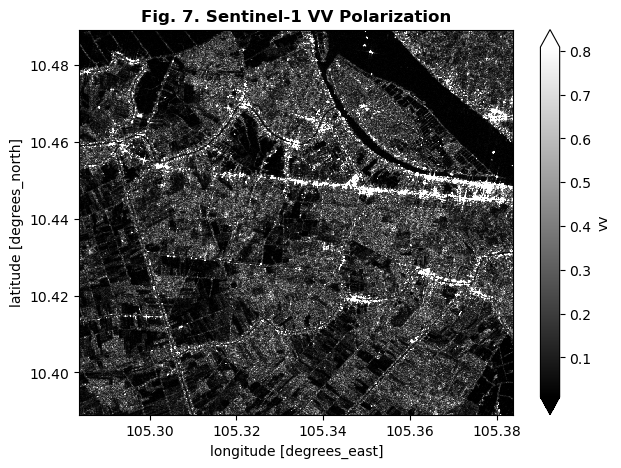

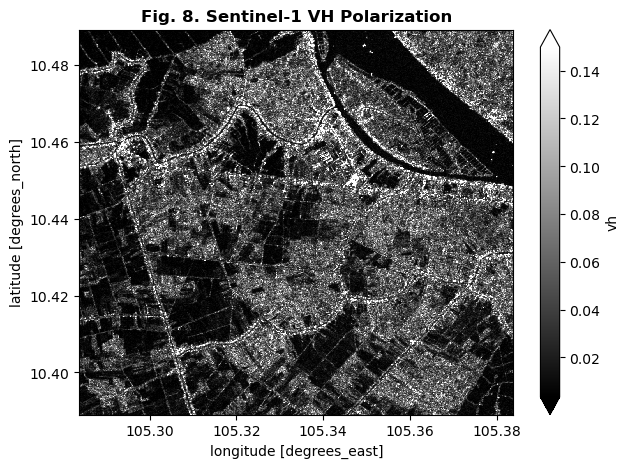

In [23]:
# Assuming that the loaded data is in 'data' variable, let's visualize the vv and vh bands
vv_band = data.vv
vh_band = data.vh

# You can select a specific time slice to visualize, e.g., the first one:
time_index = 0
vv_slice = vv_band.isel(time=time_index)
vh_slice = vh_band.isel(time=time_index)

# Plot vv polarization
plt.figure(figsize=(7, 5))
vv_slice.plot(cmap='gray', robust=True)
plt.title('Fig. 7. Sentinel-1 VV Polarization', fontweight='bold')
plt.show()

# Plot vh polarization
plt.figure(figsize=(7, 5))
vh_slice.plot(cmap='gray', robust=True)
plt.title('Fig. 8. Sentinel-1 VH Polarization', fontweight='bold')
plt.show()

### From Sentinel 2

In [24]:
box_size_deg = 0.0004
resolution = 10  # meters per pixel 
scale = resolution / 111320.0 # degrees per pixel for crs=4326 

stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
search = stac.search(collections=["sentinel-2-l2a"], bbox=bounds, datetime=time_window)
items = list(search.get_all_items())
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 31


In [25]:
xx = stac_load(
    items,
    bands=["red", "green", "blue", "nir", "SCL"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=pc.sign,
    bbox=bounds
)

# View the dimensions of our XARRAY and the variables
display(xx)

<xarray.Dataset>
Dimensions:      (latitude: 1114, longitude: 1114, time: 29)
Coordinates:
  * latitude     (latitude) float64 10.49 10.49 10.49 ... 10.39 10.39 10.39
  * longitude    (longitude) float64 105.3 105.3 105.3 ... 105.4 105.4 105.4
    spatial_ref  int32 4326
  * time         (time) datetime64[ns] 2021-12-01T03:21:09.024000 ... 2022-04...
Data variables:
    red          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 1114, 1114), meta=np.ndarray>
    green        (time, latitude, longitude) uint16 dask.array<chunksize=(1, 1114, 1114), meta=np.ndarray>
    blue         (time, latitude, longitude) uint16 dask.array<chunksize=(1, 1114, 1114), meta=np.ndarray>
    nir          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 1114, 1114), meta=np.ndarray>
    SCL          (time, latitude, longitude) uint16 dask.array<chunksize=(1, 1114, 1114), meta=np.ndarray>

#### View RGB (real color) images from the time series

Sentinel-2 data, available since 2016, offers views of any location every 5 days due to two satellites. However, in a 5-month example with 29 time slices, only 3 clear and several partially cloudy scenes were available. Extreme cloud cover sometimes prevents processing, causing "bright white" scenes. This scarcity of clear images makes using optical data for vegetation analysis quite challenging.

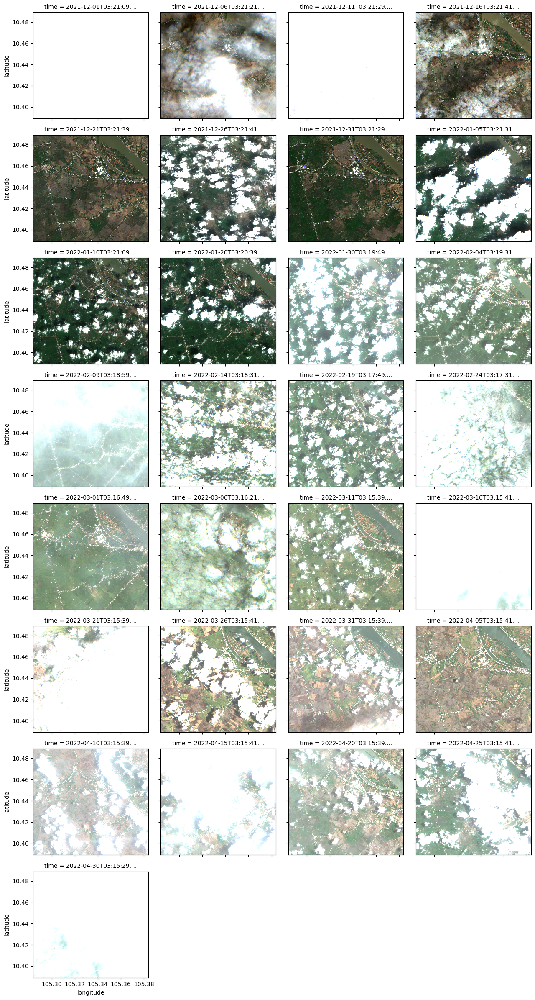

In [26]:
plot_xx = xx[["red","green","blue"]].to_array()
plot_xx.plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=3000)
plot.fig.suptitle("Fig. 9. Regions Captured from Sentinel 2", fontsize=15, fontweight='bold')
plot.fig.subplots_adjust(top=0.96)
plt.show()

In [27]:
# Select a time slice to view a simgle RGB image and the cloud mask
# See the XARRAY dimensions above for the number of time slices (starts at 0)

# Slice #6 - Mostly Clear
# Slice #8 - Scattered Clouds
# Slice #15 - Very Cloudy

time_slice = 8

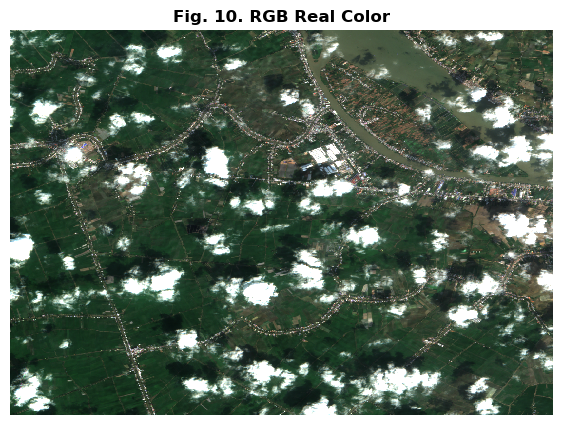

In [28]:
# Plot and RGB Real Color Image for a single date
fig, ax = plt.subplots(figsize=(7, 5))
xx.isel(time=time_slice)[["red", "green", "blue"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0, vmax=3000)
ax.set_title("Fig. 10. RGB Real Color", fontweight='bold')
ax.axis('off')
plt.show()

#### Apply Cloud Filtering and Masking

In [29]:
# Filter data using the Sentinel-2 SCL band classification

# scl=0 > No Data
# scl=1 > Saturated
# scl=3 > Cloud Shadows
# scl=6 > Water 
# scl=8 > Cloud Medium Probability 
# scl=9 > Cloud High Probability
# scl=10 > Thin Cirrus Cloud

In [30]:
# Create a colormap to display the SCL pixel classifications

scl_colormap = np.array(
    [
        [252,  40, 228, 255],  # 0  - NODATA - MAGENTA
        [255,   0,   4, 255],  # 1  - Saturated or Defective - RED
        [0  ,   0,   0, 255],  # 2  - Dark Areas - BLACK
        [97 ,  97,  97, 255],  # 3  - Cloud Shadow - DARK GREY
        [3  , 139,  80, 255],  # 4  - Vegetation - GREEN
        [192, 132,  12, 255],  # 5  - Bare Ground - BROWN
        [21 , 103, 141, 255],  # 6  - Water - BLUE
        [117,   0,  27, 255],  # 7  - Unclassified - MAROON
        [208, 208, 208, 255],  # 8  - Cloud - LIGHT GREY
        [244, 244, 244, 255],  # 9  - Definitely Cloud - WHITE
        [195, 231, 240, 255],  # 10 - Thin Cloud - LIGHT BLUE
        [222, 157, 204, 255],  # 11 - Snow or Ice - PINK
    ],
    dtype="uint8",
)

In [31]:
def colorize(xx, colormap):
    return xr.DataArray(colormap[xx.data], coords=xx.coords, dims=(*xx.dims, "band"))

# Load SCL band, then convert to RGB using color scheme above
scl_rgba = colorize(xx.isel(time=time_slice).SCL.compute(), scl_colormap)

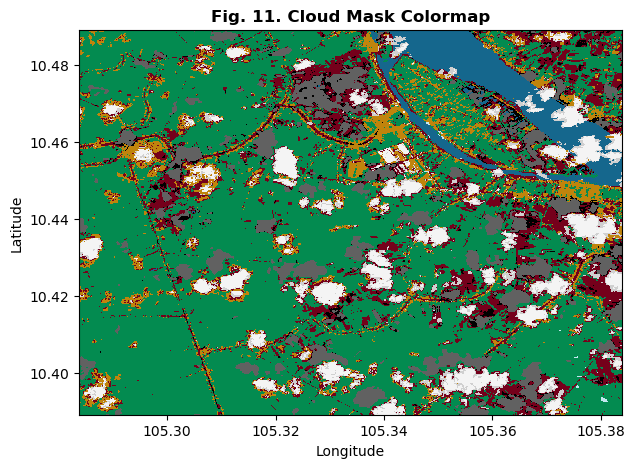

In [32]:
# Create an RGB plot of the SCL band
# Notice the clouds are bright white and the cloud shadows are grey

scl_rgba.plot.imshow(figsize=(7, 5))
plt.title("Fig. 11. Cloud Mask Colormap", fontweight='bold')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [33]:
# Create a mask for no data, saturated data, clouds, cloud shadows, and water

cloud_mask = \
    (xx.SCL != 0) & \
    (xx.SCL != 1) & \
    (xx.SCL != 3) & \
    (xx.SCL != 6) & \
    (xx.SCL != 8) & \
    (xx.SCL != 9) & \
    (xx.SCL != 10) 

In [34]:
# Apply cloud mask ... NO Clouds, NO Cloud Shadows and NO Water pixels
# All masked pixels are converted to "No Data" and stored as 16-bit integers
cleaned_data = xx.where(cloud_mask).astype("uint16")

# Load SCL band, then convert to RGB using color scheme above
scl_rgba_clean = colorize(cleaned_data.isel(time=time_slice).SCL.compute(), scl_colormap)

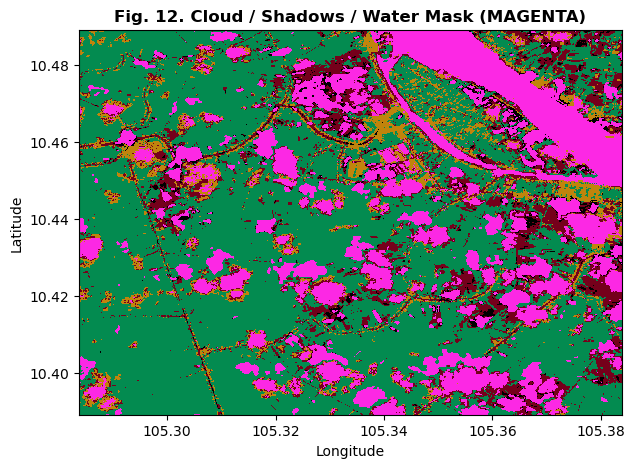

In [35]:
# Create an RGB plot of the SCL band
# Masked data (clouds/shadows/water) are shown in MAGENTA

scl_rgba_clean.plot.imshow(figsize=(7, 5))
plt.title("Fig. 12. Cloud / Shadows / Water Mask (MAGENTA)", fontweight='bold')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

<b>LAI (Leaf Area Index):</b> LAI measures vegetation canopy structure by quantifying green leaf area per ground surface unit. LAI values range from 0 (bare ground) to 6 (dense forests). For Sentinel-2, LAI is derived using visible, near-infrared, and shortwave-infrared bands through complex algorithms.

The LAI plot below shows unfiltered pixels (BLUE) and filtered pixels (GREEN). Gaps in the filtered dataset (GREEN) may occur when no "clean" pixels are available to calculate LAI. When filtered and unfiltered LAI values are similar, it indicates low cloud volume. However, when values differ significantly, it suggests high cloud volume, which can negatively impact LAI. Therefore, filtering clouds before calculating LAI for agricultural plots is crucial for obtaining accurate phenology results.

In [36]:
# Calculate the mean of the data across the sample region and then NDVI
# Perform this calculation for the unfiltered and cloud-filtered (clean) datasets
mean_unfiltered = xx.mean(dim=['longitude','latitude']).compute()
lai_mean = 0.618 * ((mean_unfiltered.nir-mean_unfiltered.red)/(mean_unfiltered.nir+mean_unfiltered.red) ** 1.334)
mean_clean = cleaned_data.mean(dim=['longitude','latitude']).compute()
lai_mean_clean = 0.618 * ((mean_clean.nir-mean_clean.red)/(mean_clean.nir+mean_clean.red) ** 1.334)

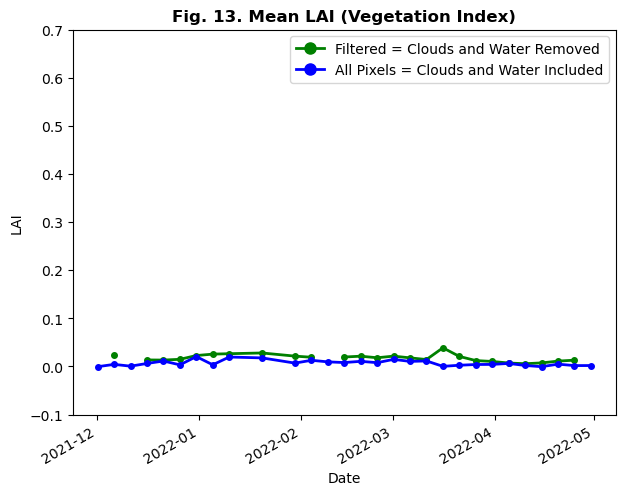

In [37]:
fig = plt.figure(figsize=(7, 5))
lai_mean_clean.plot(color='green',marker='o',markersize=4,linewidth=2, label="Filtered = Clouds and Water Removed")
lai_mean.plot(color='blue',marker='o',markersize=4,linewidth=2, label="All Pixels = Clouds and Water Included")
plt.title("Fig. 13. Mean LAI (Vegetation Index)", fontweight='bold')
plt.xlabel("Date")
plt.ylabel("LAI")
plt.ylim(-0.1,0.7)
plt.legend(loc="upper right", markerscale=2., scatterpoints=1, fontsize=10)
plt.show()

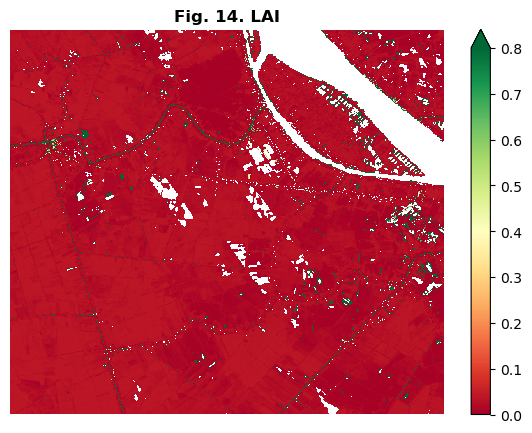

In [38]:
# Plot an NDVI image for a single date with few clouds
# We will select image (index=6) on December 31, 2021. Notice how the water is masked out.

fig = plt.figure(figsize=(7, 5))
lai_image = 0.618 * ((cleaned_data.nir-cleaned_data.red)/(cleaned_data.nir+cleaned_data.red) ** 1.334)
lai_image.isel(time=6).plot(vmin=0.0, vmax=0.8, cmap="RdYlGn")
plt.title("Fig. 14. LAI", fontweight='bold')
plt.axis('off')
plt.show()

## Feature Engineering <a id="section4"></a>

After visualization and assessment, we'll compute predictor variables for our model using spatial information and harvest dates, derived from all three satellite datasets.

We made an initial selection of predictor variables through robust research; namely [Miao (2011)](#Miao2011), [Srivastava (2012)](#Srivastava2012), [Wu (2015)](#Wu2015) and more.

### From Landsat <a id="section7.1"></a>

We use filtered data, free from clouds and water bodies, to calculate vegetation indices. Indices are computed after applying a masking algorithm on each location in our dataset. Instead of using data for an entire crop cycle, we request data for a time window around the harvest date. As Landsat provides data every 8 days, we set a time window for 8 days before and after the harvest date. This approach accounts for accurate cubic-spline interpolation, reduces noise, memory usage, processing power, processing time, and enhances data reliability.

Along with NDVI (spoken above), we chose NDWI, SAVI, EVI2 and Albedo to calculate from Landsat.

<b> NDWI (Normalized Difference Water Index): </b> The index detects water presence in vegetation, useful for identifying waterlogged and flood-affected areas, and monitoring irrigation and water management. Ranging from -1.0 to 1.0, negative values indicate low water content, while increasing values signify higher water content. It's calculated as NDWI = (NIR - SWIR) / (NIR + SWIR), with NIR representing the near-infrared band and SWIR the shortwave-infrared band.

<b>SAVI (Soil Adjusted Vegetation Index):</b> The index adjusts for soil brightness influence on vegetation indices and is helpful in low vegetation areas with high soil reflectance. SAVI ranges from -1.0 to 1.0, with negative values indicating water, values close to 0 for bare soil/low vegetation, up to 0.25 for sparse vegetation, 0.6 for growing vegetation, and 0.6 to 1.0 for dense vegetation. It's calculated as SAVI = ((NIR - Red) / (NIR + Red + L)) * (1 + L), with L being a soil adjustment factor (typically between 0 and 1).

<b>EVI 2 (Enhanced Vegetation Index 2):</b> EVI 2, a modification of the original EVI, requires only red and near-infrared bands, making it suitable for sensors like Landsat. Useful for monitoring vegetation health and productivity, it's less sensitive to atmospheric conditions and soil background signals than NDVI. Ranging from -1.0 to 1.0, negative values indicate water, and increasing values represent more vegetation. It's calculated as EVI 2 = 2.5 * ((NIR - Red) / (NIR + 2.4 * Red + 1)). 

<b>Albedo:</b> Albedo measures surface reflectivity, with values ranging from 0 (completely absorbing) to 1 (completely reflecting). In vegetation, albedo is crucial for understanding energy balance and heat exchange between land and atmosphere. Higher albedo values in croplands can indicate healthier vegetation, as denser, greener canopies reflect more solar radiation.
 
By combining these vegetation indices, we gained a comprehensive understanding of the health, productivity, and water management of the croplands, as well as the energy balance and heat exchange between the land surface and the atmosphere.

In [39]:
# Load the data using Open Data Cube for each location
from datetime import datetime, timedelta

#EVI 2 Coeeficients
G = 2.5
C1 = 6
C2 = 7.5
L = 1

latitudes = []
longitudes = []
albedo_values = []
ndvi_landsat = []
evi2_landsat = []
savi_landsat = []
ndwi_landsat = []

for index, row in locations.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    toh = row['Date of Harvest']
    date_object = datetime.strptime(toh, "%d-%m-%Y")
    
    time_delta = timedelta(days=8)
    start_date = date_object - time_delta
    end_date = date_object + time_delta
    time_window3 = f"{start_date.isoformat()}/{end_date.isoformat()}"

    bounds = (lon - box_size_deg1/2, lat - box_size_deg1/2, lon + box_size_deg1/2, lat + box_size_deg1/2)

    #Load the data using Open Data Cube
    catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
    search = catalog.search(collections=["landsat-c2-l2"], bbox=bounds, datetime=time_window3, query={"platform": {"in": ["landsat-8", "landsat-9"]}})
    items = list(search.get_all_items())
    
    #data = xr.open_rasterio(items, chunks={"x": 2048, "y": 2048}, crs="EPSG:4326", resolution=scale, patch_url=sign)
    xx = stac_load(
    items,
    bands=["red", "green", "blue", "nir08","swir16","qa_pixel"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=scale1, # Degrees
    chunks={"x": 2048, "y": 2048},
    patch_url=pc.sign,
    bbox=bounds
)
    
    # Apply scaling and offsets for Landsat Collection-2 (reference below) to the spectral bands ONLY
    # https://planetarycomputer.microsoft.com/dataset/landsat-c2-l2
    xx['red'] = (xx['red']*0.0000275)-0.2
    xx['green'] = (xx['green']*0.0000275)-0.2
    xx['blue'] = (xx['blue']*0.0000275)-0.2
    xx['nir08'] = (xx['nir08']*0.0000275)-0.2
    xx['swir16'] = (xx['swir16']*0.0000275)-0.2
 

    # Calculate the mask for the entire xarray (all time slices)
    full_mask = get_mask(xx['qa_pixel'], ['fill', 'dilated_cloud', 'cirrus', 'cloud', 'shadow', 'water'])

    # Create a "clean" dataset with the mask applied 
    cleaned_data = xx.where(~full_mask)
   
    mean_clean = cleaned_data.mean(dim=['longitude','latitude']).compute()
    
    ndvi_mean_clean = (mean_clean.nir08-mean_clean.red)/(mean_clean.nir08+mean_clean.red)
    
    evi2_mean_clean = G * ((mean_clean.nir08 - mean_clean.red) / (mean_clean.nir08 + C1 * mean_clean.red - C2 * mean_clean.blue + L))
    
    savi_mean_clean = ((mean_clean.nir08 - mean_clean.red) / (mean_clean.nir08 + mean_clean.red + 0.5)) * 1.5
    
    ndwi_mean_clean = (mean_clean.green - mean_clean.nir08) / (mean_clean.green + mean_clean.nir08)
   
    albedo = 0.356 * mean_clean.blue + 0.130 * mean_clean.green + 0.373 * mean_clean.red + 0.085 * mean_clean.nir08 + 0.072 * mean_clean.swir16 +0.0018 # constant term
   
	# Append the latitude, longitude, and NDVI values to their respective lists
    latitudes.append(lat)
    longitudes.append(lon)
    albedo_values.append(albedo)
    ndvi_landsat.append(ndvi_mean_clean)
    evi2_landsat.append(evi2_mean_clean)
    savi_landsat.append(savi_mean_clean)
    ndwi_landsat.append(ndwi_mean_clean)
 

### From Sentinel 1 <a id="section7.2"></a>

Similarly, instead of pulling data for an entire crop cycle, we only request data for a time window around the date of harvest. Sentinel 1 sends back data after every 6 days and hence, the 12 day time window. From this satellite, we calculate soil moisture.

In [40]:
# Utilising this for loamy soil as this is the best generalized soil type for Vietnam
A = 0.71
B = 1.40
sm_feature = []

# Load the data using Open Data Cube for each location
for index, row in locations.iterrows():
    lon = row['Longitude']
    lat = row['Latitude']
    toh = row['Date of Harvest']
    date_object = datetime.strptime(toh, "%d-%m-%Y")
    
    time_delta = timedelta(days=6)
    start_date = date_object - time_delta
    end_date = date_object + time_delta
    time_window3 = f"{start_date.isoformat()}/{end_date.isoformat()}"
    
    bbox = (lon - box_size_deg2/2, lat - box_size_deg2/2, lon + box_size_deg2/2, lat + box_size_deg2/2)
    catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
    search = catalog.search(collections=["sentinel-1-rtc"], bbox=bbox, datetime=time_window3)
    items = list(search.get_all_items())
    data = stac_load(items,bands=["vv", "vh"], patch_url=pc.sign, bbox=bbox, crs="EPSG:4326", resolution=scale2)
    mean = data.mean(dim=['latitude','longitude']).compute()
    dop = (mean.vv / (mean.vv + mean.vh))
    
    #Calculating Soil Moisture
    soil_moisture = (1 - ((10 ** (0.1 * dop)) / A) ** B)
    
    sm_feature.append(soil_moisture)
    

### From Sentinel 2 <a id="section7.3"></a>

Sentinel 2 sends back data after every 10 days and hence, the 20 day time window. We calculate FAPAR (along with LAI from above) from this satellite.

<b>FAPAR (Fraction of Absorbed Photosynthetically Active Radiation):</b> FAPAR indicates vegetation health and productivity by measuring the proportion of solar radiation absorbed for photosynthesis. FAPAR values range from 0 (no absorption) to 1 (complete absorption). For Sentinel-2, FAPAR is derived using visible and near-infrared bands with algorithms like the JRC-TIP model or customized approaches.

In [41]:
lai = []
fapars = []

# Load the data using Open Data Cube for each location
# Cloud Filtering process for each location
for index, row in locations.iterrows():
    lon = row['Longitude']
    lat = row['Latitude']
    toh = row['Date of Harvest']
    date_object = datetime.strptime(toh, "%d-%m-%Y")
    
    time_delta = timedelta(days=10)
    start_date = date_object - time_delta
    end_date = date_object + time_delta
    time_window3 = f"{start_date.isoformat()}/{end_date.isoformat()}"
    
    bounds = (lon - box_size_deg/2, lat - box_size_deg/2, lon + box_size_deg/2, lat + box_size_deg/2)
    stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
    search = stac.search(collections=["sentinel-2-l2a"], bbox=bounds, datetime=time_window3)
    items = list(search.get_all_items())
    
    xx = stac_load(
    items,
    bands=["red", "green", "blue", "nir","B12","SCL"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=pc.sign,
    bbox=bounds
    )
    scl_colormap = np.array(
    [
        [252,  40, 228, 255],  # 0  - NODATA - MAGENTA
        [255,   0,   4, 255],  # 1  - Saturated or Defective - RED
        [0  ,   0,   0, 255],  # 2  - Dark Areas - BLACK,
        [97 ,  97,  97, 255],  # 3  - Cloud Shadow - DARK GREY
        [3  , 139,  80, 255],  # 4  - Vegetation - GREEN
        [192, 132,  12, 255],  # 5  - Bare Ground - BROWN
        [21 , 103, 141, 255],  # 6  - Water - BLUE
        [117,   0,  27, 255],  # 7  - Unclassified - MAROON
        [208, 208, 208, 255],  # 8  - Cloud - LIGHT GREY
        [244, 244, 244, 255],  # 9  - Definitely Cloud - WHITE
        [195, 231, 240, 255],  # 10 - Thin Cloud - LIGHT BLUE
        [222, 157, 204, 255],  # 11 - Snow or Ice - PINK
    ],
    dtype="uint8",
    )
    
    cloud_mask = \
    (xx.SCL != 0) & \
    (xx.SCL != 1) & \
    (xx.SCL != 3) & \
    (xx.SCL != 6) & \
    (xx.SCL != 8) & \
    (xx.SCL != 9) & \
    (xx.SCL != 10)
    
    # Apply cloud mask ... NO Clouds, NO Cloud Shadows and NO Water pixels
    # All masked pixels are converted to "No Data" and stored as 16-bit integers
    cleaned_data = xx.where(cloud_mask).astype("uint16")
    mean_clean = cleaned_data.mean(dim=['longitude','latitude']).compute()
    lai_mean_clean = 0.618 * ((mean_clean.nir-mean_clean.red)/(mean_clean.nir+mean_clean.red) ** 1.334)
    fapar_mean_clean = (1 - (mean_clean.nir-mean_clean.red)/(mean_clean.nir+mean_clean.red)) * (1 - 0.98 ** (1 / (0.0038 * mean_clean.red)))
    
    lai.append(lai_mean_clean)
    fapars.append(fapar_mean_clean)

Now we check if our data has any missing values or 'NaN' values.

In [42]:
albedo_values[:5]

[<xarray.DataArray (time: 4)>
 array([nan, nan, nan, nan])
 Coordinates:
     spatial_ref  int32 4326
   * time         (time) datetime64[ns] 2022-07-13T03:20:15.057547 ... 2022-07...,
 <xarray.DataArray (time: 4)>
 array([nan, nan, nan, nan])
 Coordinates:
     spatial_ref  int32 4326
   * time         (time) datetime64[ns] 2022-07-13T03:20:15.057547 ... 2022-07...,
 <xarray.DataArray (time: 2)>
 array([nan, nan])
 Coordinates:
     spatial_ref  int32 4326
   * time         (time) datetime64[ns] 2022-07-13T03:20:38.965531 2022-07-21T...,
 <xarray.DataArray (time: 4)>
 array([nan, nan, nan, nan])
 Coordinates:
     spatial_ref  int32 4326
   * time         (time) datetime64[ns] 2022-07-13T03:20:15.057547 ... 2022-07...,
 <xarray.DataArray (time: 4)>
 array([nan, nan, nan, nan])
 Coordinates:
     spatial_ref  int32 4326
   * time         (time) datetime64[ns] 2022-07-13T03:20:15.057547 ... 2022-07...]

From the satellites, we see that we receive missing data, or in other words a number of missing values. To further make predictions using this data, we need to replace the 'NaN' values with real values. Replacing with zero or mean could be an option but this introduces greater bias in our data. We chose to interpolate the missing values, using cubic-spline, to accurately smoothen the data and replace the data with less bias.

In [43]:
def interpolate_and_create_dataframe(data_list, column_name, latitudes, longitudes):
    values_arrays = [data.values for data in data_list]
    lengths = [len(arr) for arr in values_arrays]
    values_flat = np.concatenate(values_arrays)

    # Get the indices of non-NaN values
    non_nan_indices = np.where(~np.isnan(values_flat))[0]
    non_nan_values = values_flat[non_nan_indices]

    # Create a cubic spline interpolator
    spline_interpolator = interp1d(non_nan_indices, non_nan_values, kind='cubic', bounds_error=False, fill_value=(non_nan_values[0], non_nan_values[-1]))

    # Replace NaN values with interpolated values
    interpolated_data = np.array([spline_interpolator(i) if np.isnan(value) else value for i, value in enumerate(values_flat)])

    # Split the interpolated_data back to original lengths
    interpolated_arrays = np.split(interpolated_data, np.cumsum(lengths)[:-1])

    data = {'Latitude': latitudes, 'Longitude': longitudes, column_name: interpolated_arrays}
    return pd.DataFrame(data)


In [44]:
al_df = interpolate_and_create_dataframe(albedo_values, 'Albedo', latitudes, longitudes)
ndvi_df = interpolate_and_create_dataframe(ndvi_landsat, 'NDVI', latitudes, longitudes)
ndwi_df = interpolate_and_create_dataframe(ndwi_landsat, 'NDWI', latitudes, longitudes)
evi2_df = interpolate_and_create_dataframe(evi2_landsat, 'EVI 2', latitudes, longitudes)
savi_df = interpolate_and_create_dataframe(savi_landsat, 'SAVI', latitudes, longitudes)
sm_df = interpolate_and_create_dataframe(sm_feature, 'Soil Moisture', latitudes, longitudes)
lai_df = interpolate_and_create_dataframe(lai, 'LAI', latitudes, longitudes)
fapar_df = interpolate_and_create_dataframe(fapars, 'FAPAR', latitudes, longitudes)

al_df.head(5)

,Latitude,Longitude,Albedo
0,10.510542,105.248554,"[0.09556685977230825, 0.09556685977230825, 0.0..."
1,10.509150,105.265098,"[0.09556685977230825, 0.09556685977230825, 0.0..."
2,10.467721,105.192464,"[0.09556685977230825, 0.09556685977230825]"
3,10.494453,105.241281,"[0.09556685977230825, 0.09556685977230825, 0.0..."
4,10.535058,105.252744,"[0.09556685977230825, 0.09556685977230825, 0.0..."


In [45]:
def count_nan_df_col(df, column_name):
    count = 0
    for array in df[column_name]:
        count += np.isnan(array).sum()
    return count

print(f"Number of NaN values in Albedo DataFrame: {count_nan_df_col(al_df, 'Albedo')}")
print(f"Number of NaN values in NDVI DataFrame: {count_nan_df_col(ndvi_df, 'NDVI')}")
print(f"Number of NaN values in NDWI DataFrame: {count_nan_df_col(ndwi_df, 'NDWI')}")
print(f"Number of NaN values in SAVI DataFrame: {count_nan_df_col(savi_df, 'SAVI')}")
print(f"Number of NaN values in EVI 2 DataFrame: {count_nan_df_col(evi2_df, 'EVI 2')}")
print(f"Number of NaN values in Soil Moisture DataFrame: {count_nan_df_col(sm_df, 'Soil Moisture')}")
print(f"Number of NaN values in LAI DataFrame: {count_nan_df_col(lai_df, 'LAI')}")
print(f"Number of NaN values in FAPAR DataFrame: {count_nan_df_col(fapar_df, 'FAPAR')}")

Number of NaN values in Albedo DataFrame: 0
Number of NaN values in NDVI DataFrame: 0
Number of NaN values in NDWI DataFrame: 0
Number of NaN values in SAVI DataFrame: 0
Number of NaN values in EVI 2 DataFrame: 0
Number of NaN values in Soil Moisture DataFrame: 0
Number of NaN values in LAI DataFrame: 0
Number of NaN values in FAPAR DataFrame: 0


We now see that we do not have NaN values anymore. But each latitude and longitude combination has a list of indicator values. This intuitively makes sense, since we pulled in data from the satellites over a specific time window around the date of harvest. Since we chose a narrow time window, we can expect the values to be quite similar. So we will just take the mean of these index values for each latitude and longitude combination.

In [46]:
def find_mean(lst):
    return sum(lst) / len(lst)

al_df['Average Albedo'] = al_df['Albedo'].apply(find_mean)
evi2_df['Average EVI 2'] = evi2_df['EVI 2'].apply(find_mean)
ndvi_df['Average NDVI'] = ndvi_df['NDVI'].apply(find_mean)
savi_df['Average SAVI'] = savi_df['SAVI'].apply(find_mean)
ndwi_df['Average NDWI'] = ndwi_df['NDWI'].apply(find_mean)
sm_df['Average Soil Moisture'] = sm_df['Soil Moisture'].apply(find_mean)
lai_df['Average LAI'] = lai_df['LAI'].apply(find_mean)
fapar_df['Average FAPAR'] = fapar_df['FAPAR'].apply(find_mean)

al_df.head()

,Latitude,Longitude,Albedo,Average Albedo
0,10.510542,105.248554,"[0.09556685977230825, 0.09556685977230825, 0.0...",0.095567
1,10.509150,105.265098,"[0.09556685977230825, 0.09556685977230825, 0.0...",0.095567
2,10.467721,105.192464,"[0.09556685977230825, 0.09556685977230825]",0.095567
3,10.494453,105.241281,"[0.09556685977230825, 0.09556685977230825, 0.0...",0.095567
4,10.535058,105.252744,"[0.09556685977230825, 0.09556685977230825, 0.0...",0.095567


In [47]:
sm_df.head()

,Latitude,Longitude,Soil Moisture,Average Soil Moisture
0,10.510542,105.248554,[-1.0884986],-1.088499
1,10.509150,105.265098,[-1.0844657],-1.084466
2,10.467721,105.192464,[-1.0281606],-1.028161
3,10.494453,105.241281,[-0.922166],-0.922166
4,10.535058,105.252744,"[-1.0514982, -1.1528931]",-1.102196


We see that our soil moisture values are negative and not between 0 and 1. We'll use Min-Max Scaler to scale it between 0 and 1 and treat any outliers.

In [48]:
scaler = MinMaxScaler()
soil_moisture = sm_df['Average Soil Moisture'].values
soil_moisture = soil_moisture.reshape(-1,1)
scaler.fit(soil_moisture)
sm_scaled = scaler.transform(soil_moisture)

sm_df['Soil Moisture Scaled'] = sm_scaled

In [49]:
feature_df = pd.concat([al_df['Average Albedo'], evi2_df['Average EVI 2'], ndvi_df['Average NDVI'], savi_df['Average SAVI'], 
                        ndwi_df['Average NDWI'], sm_df['Soil Moisture Scaled'], lai_df['Average LAI'], fapar_df['Average FAPAR']],axis=1)

feature_df.head()

,Average Albedo,Average EVI 2,Average NDVI,Average SAVI,Average NDWI,Soil Moisture Scaled,Average LAI,Average FAPAR
0,0.095567,0.447983,0.635155,0.419686,-0.583988,0.391886,0.014738,0.001890
1,0.095567,0.447983,0.635155,0.419686,-0.583988,0.406523,0.007253,0.002082
2,0.095567,0.447983,0.635155,0.419686,-0.583988,0.610874,0.009968,0.001653
3,0.095567,0.447983,0.635155,0.419686,-0.583988,0.995565,0.012170,0.001567
4,0.095567,0.447983,0.635155,0.419686,-0.583988,0.342175,0.005132,0.002304


[Abbas (2020)](#Abbas2020) and [Ray (2015)](#Ray2015) emphasize the importance of including precipitation as a predictor for rice yield variability. Therefore, we obtained precipitation data from a public website: [Visual Crossing](#Visualcrossing).

The code computes precipitation statistics (mean, maximum, minimum, and variance) for three districts in Vietnam based on historical weather data and various window sizes. These precipitation statistics are then combined with other indices for further analysis and modeling in predicting rice yield in the study area.

We selected a time frame of at least 100 days prior to each designated harvest date in the Crop Yield data to capture a complete crop cycle. This interval was chosen specifically for precipitation as the only predictor requiring a full crop cycle, given its critical importance to crop growth and development.

In [50]:
precip = weather_data['precip']
precip1 = weather_data1['precip']
precip2 = weather_data2['precip']
dates = locations['Date of Harvest']
unique_dates = dates.unique()

def sort_dates(date):
    day, month, year = date.split('-')
    return year, month, day

sorted_dates = sorted(unique_dates, key=sort_dates)

window_sizes = [168,170,171,172,174,175,176,177,178,182,183,184,185,186,187,188,190,191,193,194,
                197,201,203,278,283,285,286,287,288,290,292,293,294,295,296,301,302,304,307,308,312]

def calculate_precip_stats(precip, window_sizes):
    prec_mean = []
    prec_max = []
    prec_min = []
    prec_var = []

    for window_size in window_sizes:
        prec_mean.append(precip.iloc[:window_size].mean())
        prec_max.append(precip.iloc[:window_size].max())
        prec_min.append(precip.iloc[:window_size].min())
        prec_var.append(precip.iloc[:window_size].var())

    return prec_mean, prec_max, prec_min, prec_var

# Chau Phu
prec_df_cp, prec_max_df_cp, prec_min_df_cp, prec_var_df_cp = calculate_precip_stats(precip, window_sizes)

# Chau Thanh
prec_df_ct, prec_max_df_ct, prec_min_df_ct, prec_var_df_ct = calculate_precip_stats(precip1, window_sizes)

# Thoai Son
prec_df_ts, prec_max_df_ts, prec_min_df_ts, prec_var_df_ts = calculate_precip_stats(precip2, window_sizes)


# create a list of districts and precipitation data
districts = ['Chau_Phu'] * 41 + ['Chau_Thanh'] * 41 + ['Thoai_Son'] * 41
precipitation_data = [prec_df_cp, prec_df_ct, prec_df_ts]
max_precipitation_data = [prec_max_df_cp, prec_max_df_ct, prec_max_df_ts]
min_precipitation_data = [prec_min_df_cp, prec_min_df_ct, prec_min_df_ts]
var_precipitation_data = [prec_var_df_cp, prec_var_df_ct, prec_var_df_ts]
dates_extended = sorted_dates * 3

# flatten the precipitation data list
precipitation_data = [item for sublist in precipitation_data for item in sublist]
max_precipitation_data = [item for sublist in max_precipitation_data for item in sublist]
min_precipitation_data = [item for sublist in min_precipitation_data for item in sublist]
var_precipitation_data = [item for sublist in var_precipitation_data for item in sublist]

# create a dictionary with districts and precipitation data
prec = {'District': districts, 'Date of Harvest': dates_extended, 'Precipitation': precipitation_data}

# create a DataFrame from the dictionary
df = pd.DataFrame(prec)

new_df = pd.DataFrame({'Average Albedo': feature_df['Average Albedo'], 'Average EVI 2': feature_df['Average EVI 2'], 
                       'Average NDVI': feature_df['Average NDVI'] , 'Average SAVI': feature_df['Average SAVI'], 'Average NDWI': feature_df['Average NDWI'],
                       'Soil Moisture Scaled': feature_df['Soil Moisture Scaled'], 'Average LAI': feature_df['Average LAI'], 'Average FAPAR': feature_df['Average FAPAR']})
new_df['Date of Harvest'] = locations['Date of Harvest']
new_df['District'] = locations['District']

new_df = pd.merge(left=new_df, right=df, on=['District', 'Date of Harvest'], how='left')
new_df.drop(columns=['District', 'Date of Harvest'], inplace=True)
new_df.head()

,Average Albedo,Average EVI 2,Average NDVI,Average SAVI,Average NDWI,Soil Moisture Scaled,Average LAI,Average FAPAR,Precipitation
0,0.095567,0.447983,0.635155,0.419686,-0.583988,0.391886,0.014738,0.001890,6.304514
1,0.095567,0.447983,0.635155,0.419686,-0.583988,0.406523,0.007253,0.002082,6.304514
2,0.095567,0.447983,0.635155,0.419686,-0.583988,0.610874,0.009968,0.001653,6.304514
3,0.095567,0.447983,0.635155,0.419686,-0.583988,0.995565,0.012170,0.001567,6.304514
4,0.095567,0.447983,0.635155,0.419686,-0.583988,0.342175,0.005132,0.002304,6.322997


## Now let's start building the model ... <a id="section8"></a>

### Feature Extraction <a id="section9"></a>

Before performing feature extraction, we decided to first visualize the correlations between our predictor variables to identify any underlying patterns among them.

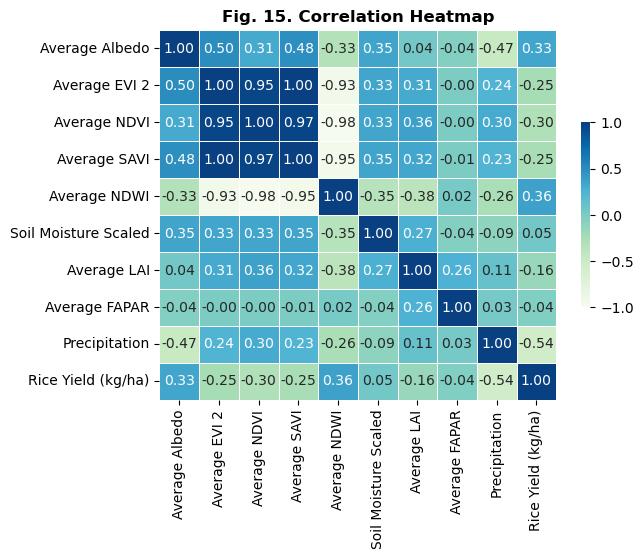

In [51]:
Xy = pd.concat([new_df, locations['Rice Yield (kg/ha)']], axis=1)
corr_matrix = Xy.corr()

sns.heatmap(corr_matrix, annot=True, cmap='GnBu', fmt='.2f', vmin=-1, vmax=1, linewidths=0.5, cbar_kws={'shrink': 0.5})
plt.title("Fig. 15. Correlation Heatmap", fontweight='bold')
plt.show()

We chose to drop EVI 2 and SAVI since they were introducing multicollinearity, and they were hampering the accuracy of the model (through submission trial and error). The rest of the predictor variables proved to be cohesive in explaining the model more accurately.

In [52]:
X = new_df.drop(['Average EVI 2', 'Average SAVI'], axis=1)
y = locations['Rice Yield (kg/ha)']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=7)
X

,Average Albedo,Average NDVI,Average NDWI,Soil Moisture Scaled,Average LAI,Average FAPAR,Precipitation
0,0.095567,0.635155,-0.583988,0.391886,0.014738,0.001890,6.304514
1,0.095567,0.635155,-0.583988,0.406523,0.007253,0.002082,6.304514
2,0.095567,0.635155,-0.583988,0.610874,0.009968,0.001653,6.304514
3,0.095567,0.635155,-0.583988,0.995565,0.012170,0.001567,6.304514
4,0.095567,0.635155,-0.583988,0.342175,0.005132,0.002304,6.322997
...,...,...,...,...,...,...,...
552,0.103500,0.276822,-0.293980,0.312321,0.008460,0.002309,4.880829
553,0.101659,0.274692,-0.290260,0.258631,-0.000857,0.003941,4.880829
554,0.098459,0.235508,-0.246019,0.270103,0.003758,0.002130,4.880829
555,0.087463,0.391458,-0.349544,0.095472,0.000443,0.003120,4.770647


We'll set up machine learning models tailored to our input parameters, experimenting with Random Forest, Gradient Boosting, XGBoost, and CatBoost. These four models effectively handle non-linear and complex relationships, as observed in the correlation heatmap, and provide robust regularization to prevent overfitting. Gradient Boosting combines multiple decision trees for better performance on complex datasets, while XGBoost offers an optimized, scalable version of Gradient Boosting. CatBoost, though commonly used for categorical data, is fast, efficient, and resistant to overfitting.

### ML Regression Models <a id="section10"></a>

In [53]:
def train_and_evaluate(model, model_name, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"{model_name} Accuracy: {r2:.4f}")
    print(f"{model_name} MSE: {mse**(1/2):.4f}")
    print()
    return model, y_pred

# Create model instances
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=18, learning_rate=0.201, seed=42)
rf_model = RandomForestRegressor(n_estimators=15, max_depth=5, random_state=42)
gb_model = GradientBoostingRegressor(n_estimators=15, learning_rate=0.21, random_state=42)
cb_model = CatBoostRegressor(learning_rate=0.21, depth=5, n_estimators=18, verbose=0, random_state=42)

# Train and evaluate models
xgb_model, y_pred_xgb = train_and_evaluate(xgb_model, "XGBoost Regression", X_train, y_train, X_test, y_test)
rf_model, y_pred_rf = train_and_evaluate(rf_model, "Random Forest Regression", X_train, y_train, X_test, y_test)
gb_model, y_pred_gb = train_and_evaluate(gb_model, "Gradient Boosting Regression", X_train, y_train, X_test, y_test)
cb_model, y_pred_cb = train_and_evaluate(cb_model, "CatBoost Regression", X_train, y_train, X_test, y_test)

XGBoost Regression Accuracy: 0.5858
XGBoost Regression MSE: 473.2413

Random Forest Regression Accuracy: 0.5740
Random Forest Regression MSE: 479.9336

Gradient Boosting Regression Accuracy: 0.5975
Gradient Boosting Regression MSE: 466.4801

CatBoost Regression Accuracy: 0.6205
CatBoost Regression MSE: 452.9707



We can visualize the performance of these models using scatter plots to better understand their regression characteristics.

Bagging, short for Bootstrap Aggregating, is an ensemble learning technique used to improve the performance and stability of machine learning models. It combines the predictions of multiple base models to produce a more accurate and robust aggregated prediction. Bagging is particularly effective in reducing the variance and overfitting of models that have high sensitivity to small changes in the training data, such as decision trees. To evaluate bagging, we compared it with boosting and stacking algorithms. Boosting and Stacking out-performed bagging in the training phase, but were not accurate enough on unseen data. On the other, bagging was consistent.

After extensive trials and cross-validation, our best leaderboard score was achieved using four base models: Random Forest, XGBoost, Gradient Boosting, and CatBoost. These models offer diversity, strong performance, robustness, and complementary strengths, helping reduce overfitting and improve ensemble predictions. Unique advantages include XGBoost's speed and CatBoost's handling of categorical features, while techniques like averaging predictions in Random Forest and regularization in boosting algorithms enhance robustness. The ensemble benefits from complementary strengths, like Random Forest's noise handling and boosting techniques' ability to capture complex relationships.

### Bagging <a id="section11"></a>

In [54]:
voting_regressor = VotingRegressor(estimators=[('rf', rf_model), ('xgb', xgb_model), ('cb', cb_model), ('gb', gb_model)])
voting_regressor.fit(X_train, y_train)

y_pred_bagging = voting_regressor.predict(X_test)
r2_bagging = r2_score(y_test, y_pred_bagging)
mse_bagging = mean_squared_error(y_test, y_pred_bagging)

print(f"Boosting Regression Accuracy: {r2_bagging:.4f}")
print(f"Boosting Regression MSE: {mse_bagging**(1/2):.4f}")

Boosting Regression Accuracy: 0.6186
Boosting Regression MSE: 454.0947


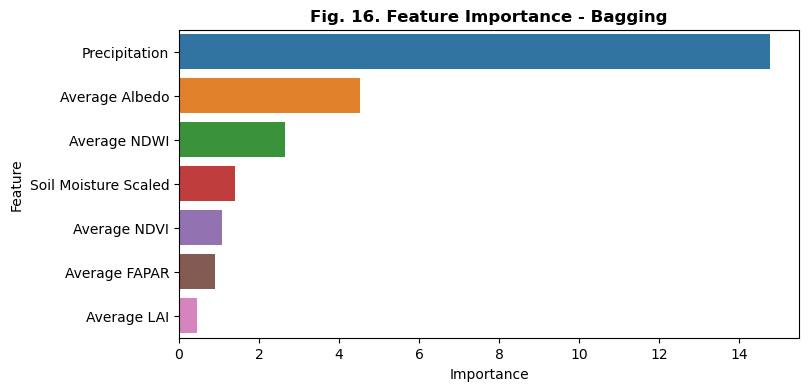

In [55]:
# Get feature importances from each individual model
rf_importance = rf_model.feature_importances_
xgb_importance = xgb_model.feature_importances_
cb_importance = cb_model.get_feature_importance()
gb_importance = gb_model.feature_importances_

# Average feature importances across all base models
average_importance = np.mean([rf_importance, xgb_importance, cb_importance, gb_importance], axis=0)

# Sort the features based on their average importance
sorted_idx = np.argsort(average_importance)[::-1]

# Create a DataFrame with sorted feature importances
importance_df = pd.DataFrame({'feature': X_train.columns[sorted_idx], 'importance': average_importance[sorted_idx]})

# Plot the feature importances using Seaborn
plt.figure(figsize=(8, 4))
sns.barplot(x='importance', y='feature', data=importance_df)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Fig. 16. Feature Importance - Bagging', fontweight='bold')
plt.show()

In [56]:
import pickle

with open('bagging_model.pkl', 'wb') as file:
    pickle.dump(voting_regressor, file)

## Bottlenecks and Methods of Improvement <a id="section12"></a>

1. **Feature Engineering Improvements:** As new data and research become available, there's always potential for enhancement in feature engineering.

2. **Exploring Alternative Regression Techniques:** Although we experimented with several models, there may be others that outperform those tested. For instance, Neural Networks can effectively capture complex relationships in a dataset.

3. **Outlier Treatment:** In this particular case, scaling the input features was deemed non-essential, as we were primarily calculating indices. However, we would still want to standardize input features to promote cohesion and mitigate the impact of outliers.

4. **Weather Data Automation:** Our precipitation calculation involved manually defining the 100-day window sizes for each location on our ground truth data and unseen data. This approach worked for the sake of this competition but is not feasible in the long-run. We would want to figure a way to automate this process.

5. **Creating a universal model:** Our approach aims to predict rice yield on any given day, contingent upon the availability of satellite data for that day. To accommodate various scenarios, such as drought, flood, or delayed weather conditions, we seek to train our model on a larger and more diverse ground truth dataset. This will help ensure the model's generalizability across a wide range of situations. To assess the model's performance, we will employ a learning curve, providing insights into the model's ability to adapt to different circumstances and its potential for further improvement.

6. **Optimizing Runtime:** Lastly we would want to optimize the for-loops in the vegetable index calculations using parallel processing techniques to improve runtime. This way the model can be effiently scaled.

## Impacts of our Project <a id="section13"></a>

1. **Improve Resource Allocation:** Accurate yield predictions can help farmers and agricultural organizations allocate resources more efficiently, such as water, fertilizers, and labor. This ensures that resources are not wasted and are used where they will have the greatest impact on crop growth.

2. **Optimize Harvest:** Predicting rice yield can assist farmers in determining the optimal time to harvest their crops, leading to a higher yield and better-quality produce. This helps minimize crop losses and ensures that the harvest is maximized.

3. **Improve Food Availability:** Better predictions of rice yield can lead to increased food production, ensuring that there is enough food to meet the demands of the population. This can help to reduce the country's reliance on food imports, contributing to improved food security.

4. **Scalability:** While the current focus is on Vietnam, the methods and models you've developed can be applied to other regions on a global scale. Optimizing runtime (spoken above) can make the code handle much larger amounts of data efficiently.

## References <a id="section14"></a>

1. <a id="sdgindicators"> United Nations. (n.d.). [https://unstats.un.org/sdgs/report/2022/](https://unstats.un.org/sdgs/report/2022/)
2. <a id="Seungtaek2021"> Seungtaek Jeong et al. (2021). Sci. Total Environ. [https://www.sciencedirect.com/science/article/pii/S0048969721048014](https://www.sciencedirect.com/science/article/pii/S0048969721048014)
3. <a id="Xu2021"> Xu et al. (2021). Remote Sens. 13, 3994. [https://doi.org/10.3390/rs13193994](https://doi.org/10.3390/rs13193994)
4. <a id="Miao2011"> Miao et al. (2011) - Miao, Y., Mulla, D. J., & Robert, P. C. Precision Agriculture, 12(1), 34-50.
5. <a id="Srivastava2012"> Srivastava et al. (2012) - Srivastava, P. K., Han, D., Ramirez, M. A., & Bray, M. Environmental Monitoring and Assessment, 184(6), 3467-3482.
6. <a id="Wu2015"> Wu et al. (2015) - Wu, M., Niu, Z., Tang, Q., Huang, W., Rivard, B., & Feng, J. Agricultural and Forest Meteorology, 200, 251-263.
7. <a id="Visualcrossing"> 9-11. Visual Crossing. Chau Phu, Chau Thanh, Thoai Son Weather History. [https://www.visualcrossing.com/weather-history/](https://www.visualcrossing.com/weather-history/)
8. <a id="Ray2015"> Ray, D.K., et al. (2015). Climate variation explains a third of global crop yield variability. Nature Communications, 6, 5989. [https://doi.org/10.1038/ncomms6989](https://doi.org/10.1038/ncomms6989)
9. <a id="Abbas2020"> Abbas & Mayo. (2020). Environ. Dev. Sustain. 23(2), 1706–1728. [https://doi.org/10.1007/s10668-020-00647-8](https://doi.org/10.1007/s10668-020-00647-8)
10. Xiao et al. (2006). Remote Sens. Environ. 100(1), 95-113. [https://www.sciencedirect.com/science/article/pii/S0034425705003433](https://www.sciencedirect.com/science/article/pii/S0034425705003433)